# Treat a single file
This notebook showcases the basic utilisation of the library to treat a single file.

## Set up
First of all, load generic libraries.

In [1]:
from pathlib import Path
from pprint import pprint, pformat
import tomllib
import matplotlib.pyplot as plt

Now we load a file that holds the position of every diagnostic as well as their nature: current probe, electric field probe, etc.

In [2]:
project = Path("../data/test")
config_path = Path(project, "testbench_configuration.toml")

with open(config_path, "rb") as f:
    config = tomllib.load(f)

We create a `MultipactorTest` object. It needs `config`, the test bench configuration, and a `.csv` file containing the data produced by `LabVIEW`.

In [3]:
from multipac_testbench.multipactor_test import MultipactorTest
results_path = Path(project, "120MHz-SWR4.csv")  # send email placais[ at ]lpsc.in2p3.fr to get the file
multipactor_test = MultipactorTest(results_path,
                                   config,
                                   freq_mhz=120.,
                                   swr=4.,
                                   sep=',')

## Exploring the data structure
The ``MultipactorTest`` object that we created has a ``pick_ups`` attribute, which is a ``list`` of ``PickUp`` objects.

In [4]:
print("The pick-ups are:")
for pick_up in multipactor_test.pick_ups:
    print(pick_up)

print(' ')
my_pick_up = multipactor_test.pick_ups[5]
print(f"The sixth pick-up is named {my_pick_up.name}.")

The pick-ups are:
Pick-Up E1 at z = 0.000m, with instruments: ['CurrentProbe (NI9205_MP1l)', 'FieldProbe (NI9205_E1)']
Pick-Up V1 at z = 0.130m, with instruments: ['Penning (NI9205_Penning1)']
Pick-Up E2 at z = 0.260m, with instruments: ['CurrentProbe (NI9205_MP2l)', 'FieldProbe (NI9205_E2)']
Pick-Up E3 at z = 0.390m, with instruments: ['CurrentProbe (NI9205_MP3l)', 'FieldProbe (NI9205_E3)']
Pick-Up V2 at z = 0.611m, with instruments: ['Penning (NI9205_Penning)']
Pick-Up E4 at z = 0.611m, with instruments: ['CurrentProbe (NI9205_MP4l)', 'FieldProbe (NI9205_E4)']
Pick-Up E5 at z = 0.832m, with instruments: ['CurrentProbe (NI9205_MP5l)', 'FieldProbe (NI9205_E5)']
Pick-Up E6 at z = 0.962m, with instruments: ['CurrentProbe (NI9205_MP6l)', 'FieldProbe (NI9205_E6)']
Pick-Up V3 at z = 1.092m, with instruments: ['Penning (NI9205_Penning2)']
Pick-Up E7 at z = 1.222m, with instruments: ['CurrentProbe (NI9205_MP7l)', 'FieldProbe (NI9205_E7)']
 
The sixth pick-up is named E4.


Each ``PickUp`` has an attribute ``instruments``, holding its ``list`` of ``Instruments``.

In [5]:
instruments = my_pick_up.instruments
print("The instruments of this pick_up are:")
for instrument in instruments:
    print(instrument)
print(' ')

print(f"The first of those is a {instruments[0].class_name}, and it measured:\n{instruments[0].data_as_pd}.")

The instruments of this pick_up are:
CurrentProbe (NI9205_MP4l)
FieldProbe (NI9205_E4)
 
The first of those is a CurrentProbe, and it measured:
Sample index
0      10.46
1      11.11
2      11.44
3      11.77
4       9.47
       ...  
353    11.44
354    12.10
355    11.44
356    11.11
357    10.78
Name: NI9205_MP4l, Length: 358, dtype: float64.


Note that ``MultipactorTest`` also has a ``global_diagnostics`` list of ``Instruments``.
In particular, it should hold a ``Powers`` instrument that saves the forward and reflected power during the test.

## Other useful functions

In order to access the instruments, you have to import corresponding class types

In [6]:
import multipac_testbench.instruments as ins
pprint(f"The implemented instruments are: {ins.__all__}")

("The implemented instruments are: ['CurrentProbe', 'IElectricField', "
 "'FieldProbe', 'ForwardPower', 'Frequency', 'Instrument', 'OpticalFibre', "
 "'OpticalFibre', 'Penning', 'Power', 'Reconstructed', 'ReflectedPower', "
 "'ReflectionCoefficient', 'RPA', 'RPACurrent', 'RPAPotential', 'SWR', "
 "'VirtualInstrument']")


You can use the `get_instruments` method to get the desired instruments.

In [7]:
current_probes = multipactor_test.get_instruments(ins.CurrentProbe)
[str(x) for x in current_probes]

['CurrentProbe (NI9205_MP1l)',
 'CurrentProbe (NI9205_MP2l)',
 'CurrentProbe (NI9205_MP3l)',
 'CurrentProbe (NI9205_MP4l)',
 'CurrentProbe (NI9205_MP5l)',
 'CurrentProbe (NI9205_MP6l)',
 'CurrentProbe (NI9205_MP7l)']

If you expect only one instrument, call `get_instrument` instead (will raise a warning if several instruments match the description).

In [8]:
# Will raise a warning as there are two Power object: a ForwardPower, a ReflectedPower
power = multipactor_test.get_instrument(ins.Power)
str(power)

forward_power = multipactor_test.get_instrument(ins.ForwardPower)
str(forward_power)

'ForwardPower (NI9205_Power1)'

## The user interface
Hopefully, there is easier ways to access and plot the data.

### Plot signal measured by instruments, perform basic post-treatment operations

In [9]:
instruments_class_to_plot = (ins.FieldProbe, ins.CurrentProbe)

Now we can plot the raw signal measured by the current and electric field probes by using the ``plot_pick_ups`` method from ``MultipactorTest``.

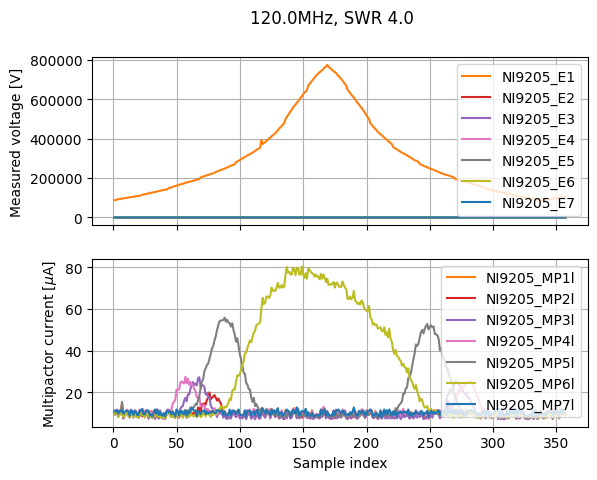

In [10]:
_ = multipactor_test.sweet_plot(
    *instruments_class_to_plot,
)

In this test, we had issues with the electric field probe at the E1 pick-up.
The measured electric field was way too high, so we remove it from the plot by doing:
(also, we won't need the pressure pick-ups)

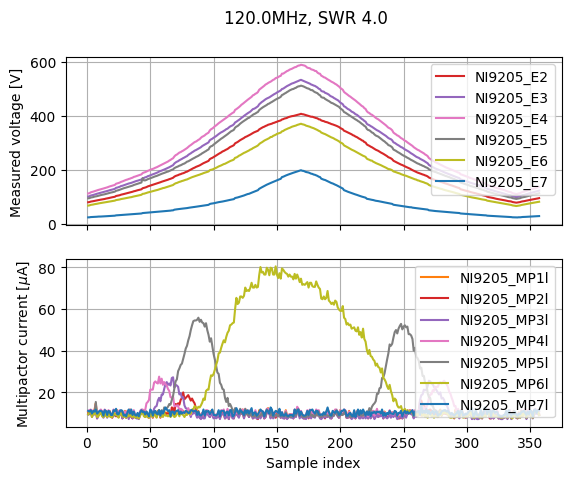

In [11]:
measurement_points_to_exclude = ("E1", "V1", "V2", "V3")
exclude = 'NI9205_E1',

_ = multipactor_test.sweet_plot(
    *instruments_class_to_plot,
    exclude=exclude,
)

This is much better!
Now we would like to smooth the current data.

In [12]:
from multipac_testbench.util.post_treaters import running_mean
# you can replace running_mean by any function, it just needs to take in an array, and return another array with the same shape

from functools import partial
# partial allows us to set some function keywords arguments once and for all

current_smoother = partial(
    running_mean,  # the base function
    n_mean=10,     # to perform the running mean over 10 samples
    mode='same',   # for more info, go to the documentation
)

multipactor_test.add_post_treater(
    current_smoother,  # the smoothing function
    ins.CurrentProbe,      # the instrument concerned by this post-treatment
)

Now we can plot the smoothed data:

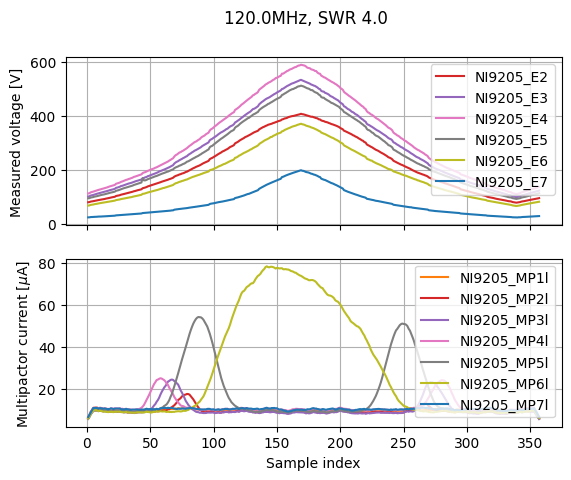

In [13]:
_ = multipactor_test.sweet_plot(
    *instruments_class_to_plot,
    exclude=exclude,
)

Note that you can define your own post-treater.
For example, if you want to plot the current in A instead of µA, define a function that multiplies an array by ``1e-6``.
Then, add it to the ``MultipactorTest`` with the ``add_post_treater`` method.

## Detecting multipator
We need to define a function that takes in the ``ydata`` of an ``Instrument``, and returns an boolean array where ``False`` means no multipactor, ``True`` means multipactor.

In [14]:
from multipac_testbench.util.multipactor_detectors import quantity_is_above_threshold
# this simple function returns True when ydata crosses a threshold

# Define our multipactor criterions, that we will apply on the CurrentProbe
current_multipactor_criterions = {
    'threshold': 14.,              # current above which there is multipactor
    'consecutive_criterion': 10,   # multipactor zones separated by this number of measure points or less will be gathered
    'minimum_number_of_points': 3, # multipactor zones measured on less than 3 consecutive points will not be considered as MP
}
current_multipac_detector = partial(quantity_is_above_threshold,
                                    **current_multipactor_criterions)

current_multipactor_bands = multipactor_test.detect_multipactor(
    current_multipac_detector,  # function that detects multipactor
    ins.CurrentProbe,               # Instrument on which it is applied
    measurement_points_to_exclude=measurement_points_to_exclude,
)

The different multipactor zones are stored in a `MultipactorBands` object.

In [15]:
current_multipactor_bands

[NI9205_MP2l: 1 bands detected,
 NI9205_MP3l: 2 bands detected,
 NI9205_MP4l: 2 bands detected,
 NI9205_MP5l: 2 bands detected,
 NI9205_MP6l: 2 bands detected,
 NI9205_MP7l: 0 bands detected,
 None]

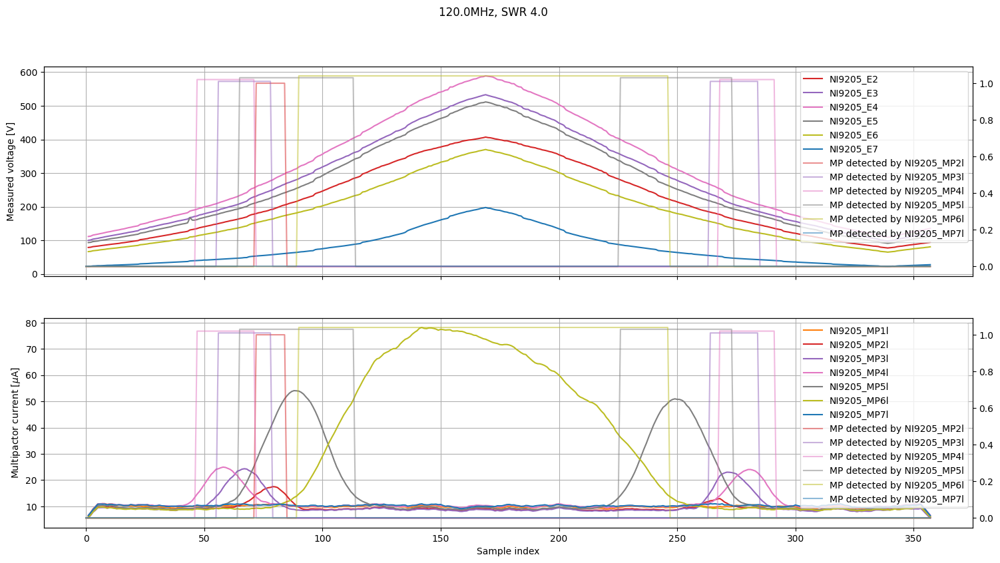

In [16]:
# Also, we would like to save this plot, so we precise ``png_path``
png_path = results_path.with_suffix(".probes.png")
csv_path = results_path.with_suffix(".probes.csv")

_ = multipactor_test.sweet_plot(
    *instruments_class_to_plot,
    exclude=exclude,
    # png_path=png_path,  # if you want to save the plot
    # csv_path=csv_path,  # if you want to save the data used to produce the plot
    test_multipactor_bands=current_multipactor_bands,
    figsize=(18,9),
)

## Reconstructing the electric field along the linac

We want to know the voltage in the whole waveguide, not only at the electric field probes.

In [17]:
multipactor_test.reconstruct_voltage_along_line(
    name="reconstructed",                # name of the instrument that will hold voltage along the coax
    probes_to_ignore=('NI9205_E1', ),    # those probes will not be used to fit the voltage
)
reconstructed = multipactor_test.get_instrument(ins.Reconstructed)
reconstructed.fit_info

'$\\psi_0 = $3.359\n$r^2 = $0.980'

This function tries to find $\psi_0$ so that we have:

\begin{equation}
|V_\mathrm{coax}(z)| = 2\sqrt{P_f Z_0} \sqrt{1 + |\Gamma|^2 + 2|\Gamma|\cos{(2\beta z + \psi_0)}}
\end{equation}

$P_f$ is the forward RMS power registered by LabVIEW.
$\Gamma$ is calculated from $P_f$ and $P_r$ registered LabVIEW.
$z$ is the position in the waveguide.
$\beta = c/f$.
$V_\mathrm{coax}(z)$ is now stored in ``reconstructed``.

We can visualise the field and other diagnostics with time.

## Creating animations

First of all, we set the ``instruments_to_plot`` variable. As on one plot we want both the electric field probe data (object ``FieldProbe``) and the reconstructed voltage (object ``Reconstructed``), we import ``IElectricField`` which is the mother of both those objects.

In [18]:
instruments_to_plot = (ins.IElectricField, ins.CurrentProbe)

# A small test, for the sake of comprehension:
print(f"IElectricField is mother class of FieldProbe: {issubclass(ins.FieldProbe, ins.IElectricField)}")
print(f"IElectricField is mother class of Reconstructed: {issubclass(ins.Reconstructed, ins.IElectricField)}")

IElectricField is mother class of FieldProbe: True
IElectricField is mother class of Reconstructed: True


In [19]:
gif_path = results_path.with_suffix(".gif")
fps = 100
ani = multipactor_test.animate_instruments_vs_position(
    instruments_to_plot,                                # the instruments to plot
    instruments_to_ignore_for_limits=('NI9205_E1', ),   # the E1 electric field probe will be plotted without modifying the limits
    # gif_path=gif_path,                                  # providing this will create a .gif file 
    fps=fps,                                            # frames per second
    keep_one_frame_over=10,                             # to keep only one image over 10
)
plt.close()

Trick to let the ``gif`` appear.

In [20]:
from IPython.display import HTML
HTML(ani.to_jshtml(fps=fps))

Note that thanks to the multipactor current plot, you can detect where and when multipactor appears.

## Representation of multipacting voltages
This is not fully implemented yet. But you can display for which voltage the multipactor appears at each probe (voltages measured by the probes).

In [21]:
if False:
    png_path = results_path.with_suffix('.multipactor.png')
    fig_kw = {'subplot_kw': {'ylim': (0., 0.2)}}
    
    _ = multipactor_test.scatter_instruments_data(
        instruments_to_plot=(ins.FieldProbe, ),
        multipactor_bands=current_multipactor_bands,
        measurement_points_to_exclude=('E1', 'V1', 'V2', 'V3'),
        png_path=png_path,
        **fig_kw,
    )
# Currently not working